In [1]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=30)

In [2]:
import matplotlib.pyplot as plt

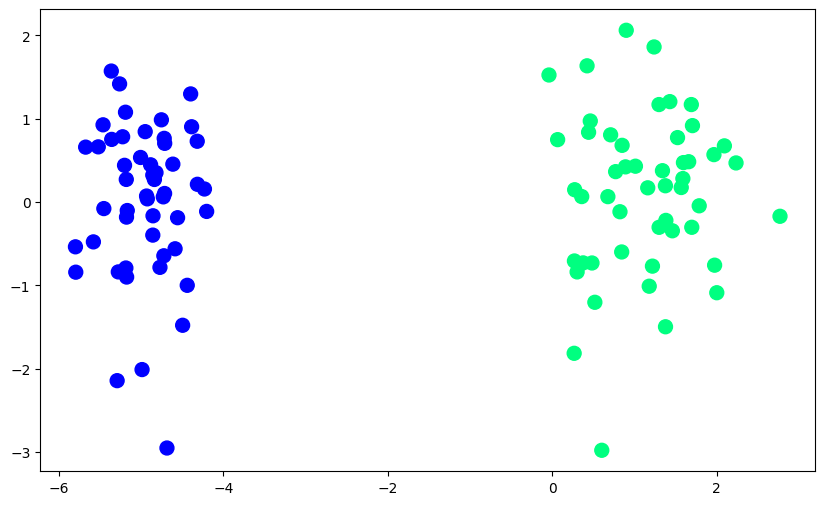

In [3]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100 )

In [4]:
# Defining Perceptron
def perceptron(X,y):

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

    return weights[0],weights[1:]

In [5]:
# Step function
def step(z):
    return 1 if z>0 else 0

In [6]:
intercept_,coef_ = perceptron(X,y)

In [7]:
print(coef_)
print(intercept_)

[1.1204053  0.40381514]
1.2000000000000002


In [8]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [9]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

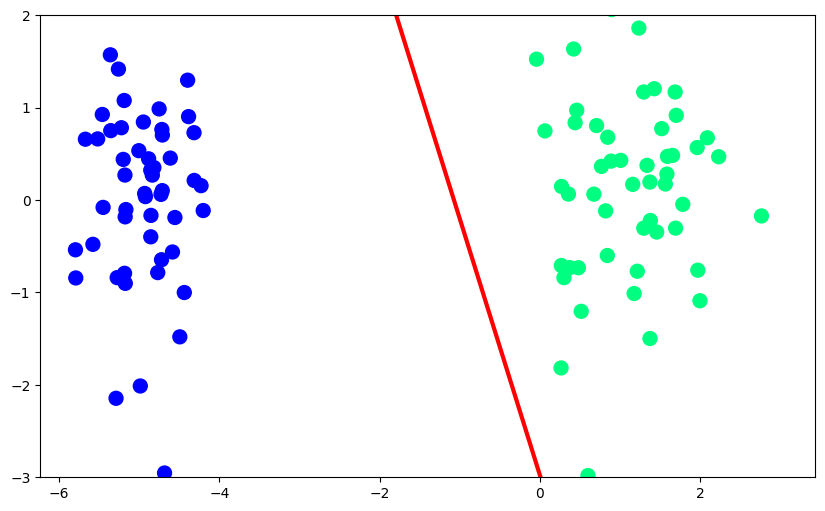

In [10]:
# Visualizing Perceptron Trick
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

Clearly it's Overfitting, although it's working fine

In [11]:
# EXPERIMENT With the line
# Visualizing the learning rate

def perceptron(X,y):

    m = []
    b = []

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))

    return m,b

In [12]:
m,b = perceptron(X,y)

In [13]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [14]:
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i*m[0] + b[0]
ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=100)
line, = ax.plot(x_i, y_i, 'r-', linewidth=2)
plt.ylim(-3, 3)

def update(i):
    label = f'Epoch {i + 1}'
    line.set_ydata(x_i * m[i] + b[i])
    ax.set_xlabel(label)
    return line,  # must return a tuple

anim = FuncAnimation(fig, update, frames=200, interval=100, repeat=True)

# Display animation in Colab
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>

In [15]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression()
lor.fit(X,y)

LogisticRegression()

In [16]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

In [17]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

In [18]:
import matplotlib.pyplot as plt
%matplotlib inline

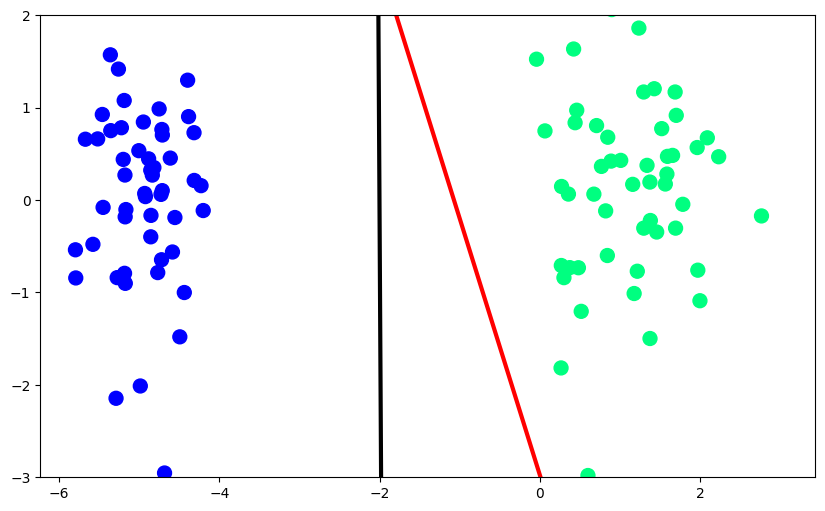

In [20]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)  # which we found using our equation ~ Perceptron Trick
plt.plot(x_input1,y_input1,color='black',linewidth=3) # line from inbuilt Scikit learn
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)
plt.show()

In [21]:
# Let's Visualize
# Perceptron Trick line
# Line with Sigmoid fn defined
# Line with Scikit Regression


In [22]:
def perceptron(X,y):

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = sigmoid(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

    return weights[0],weights[1:]

In [23]:
# Define Sigmoid
def sigmoid(z):
    return 1/(1 + np.exp(-z))

In [24]:
intercept_,coef_ = perceptron(X,y)

In [25]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [26]:
x_input2 = np.linspace(-3,3,100)
y_input2 = m*x_input + b

(-3.0, 2.0)

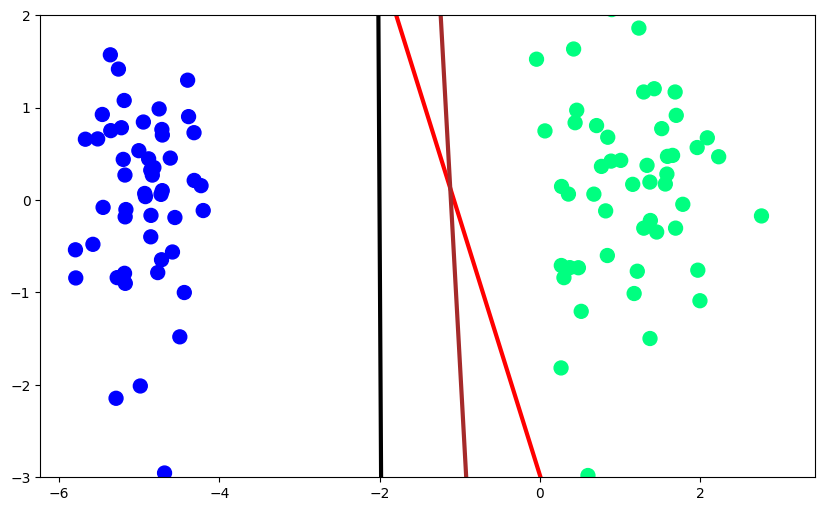

In [27]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)  # Perceptron : Step fn
plt.plot(x_input1,y_input1,color='black',linewidth=3) # Scikit Regression model
plt.plot(x_input2,y_input2,color='brown',linewidth=3) # Sigmoid fn
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [28]:
# Why Brown line not Best fit ??
# Because we have to minimize the error fn

In [98]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=20)

In [99]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression(penalty=None,solver='sag') # removed regularisation
lor.fit(X,y)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LogisticRegression(penalty=None, solver='sag')

In [100]:
print(lor.coef_)
print(lor.intercept_)

[[4.79687969 0.20596717]]
[5.77424903]


In [101]:
m1 = -(lor.coef_[0][0]/lor.coef_[0][1])
b1 = -(lor.intercept_/lor.coef_[0][1])

In [102]:
x_input = np.linspace(-3,3,100)
y_input = m1*x_input + b1

In [103]:
def gd(X,y):

    X = np.insert(X,0,1,axis=1) #adding intercept term
    weights = np.ones(X.shape[1])
    lr = 0.5 #learning rate

    for i in range(30000):
        y_hat = sigmoid(np.dot(X,weights))  # y_hat = sigmoid(X.W)
        weights = weights + lr*(np.dot((y-y_hat),X)/X.shape[0])  #weight rule

    return weights[1:],weights[0]


In [104]:
def sigmoid(z):
    return 1/(1 + np.exp(-z))

In [105]:
coef_,intercept_ = gd(X,y)

In [106]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [107]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input1 + b

(-3.0, 2.0)

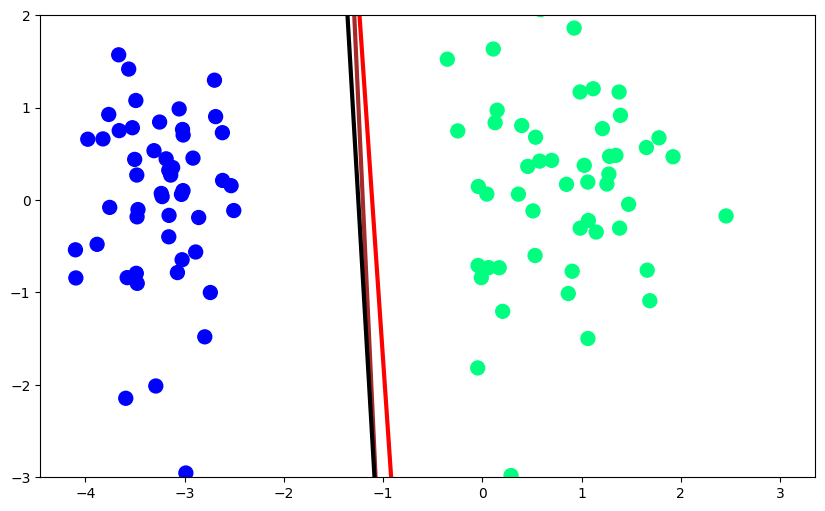

In [110]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='brown',linewidth=3)  #Sigmoid fn
plt.plot(x_input1,y_input1,color='black',linewidth=3) # Scikit Regression model
plt.plot(x_input2,y_input2,color='red',linewidth=3) #  Perceptron : Step fn
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

Brown line is very close, but unable to coincide with Scikit learn line, maybe scikit is more refined